In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
# DBSCAN
from sklearn.cluster import DBSCAN
# k nearest neighburs 
from sklearn.neighbors import NearestNeighbors
# scaler
from sklearn.preprocessing import StandardScaler
# silhouette scores
from sklearn.metrics import silhouette_score, silhouette_samples
import folium

In [3]:
data = pd.read_table("./data/cleaned-data.csv", sep=",")

In [4]:
# Scale the data
columns_to_drop = ['id', 'user', 'tags', 'title',  'date_taken_minute', 'date_taken_hour', 'date_taken_day', 'date_taken_month', 'date_taken_year', 'date_upload_minute', 'date_upload_hour', 'date_upload_day', 'date_upload_month', 'date_upload_year', 'Unnamed: 16',	'Unnamed: 17',	'Unnamed: 18']
df_clustering = data.drop(columns_to_drop , axis=1)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_clustering)
# show
print(scaled_data)
# create a DataFrame
scaled_data_df = pd.DataFrame(data=scaled_data, columns=df_clustering.columns)
scaled_data_df.head()

[[-0.46842127 -0.56311456]
 [-0.52422679  0.71829489]
 [-0.26470298  0.20909286]
 ...
 [-0.15920663 -0.11875508]
 [-0.15920663 -0.11875508]
 [-0.35164433 -0.2444322 ]]


,lat,long
0,-0.468421,-0.563115
1,-0.524227,0.718295
2,-0.264703,0.209093
3,0.555687,1.063759
4,0.555687,1.063759


In [5]:
def find_optimal_eps(data, min_pts):
    # Calculate distances to k-nearest neighbors
    neigh = NearestNeighbors(n_neighbors=min_pts)
    neigh.fit(data)
    distances, _ = neigh.kneighbors(data)
    
    
    # Sort distances to kth neighbor in ascending order
    k_distances = np.sort(distances[:, min_pts-1])
    
    # Create plot
    fig = px.line(
        x=range(len(k_distances)),
        y=k_distances,
        title=f'K-distance Graph (k={min_pts})',
        labels={'x': 'Points sorted by distance', 
                'y': f'Distance to {min_pts}th nearest neighbor'}
    )
    
    return fig

In [6]:
fig = find_optimal_eps(scaled_data, 4)
fig.show() # display the plot

In [7]:
best_eps = 0.033 #0.13
best_min_samples = 4
# Apply DBSCAN with best parameters
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = best_dbscan.fit_predict(scaled_data)

In [8]:
data['cluster dbscan'] = best_labels
data['silhouette dbscan'] = silhouette_samples(scaled_data, best_labels, metric='euclidean')
print(best_labels)
data

[0 0 0 ... 0 0 0]


,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_minute,date_upload_hour,date_upload_day,date_upload_month,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,cluster dbscan,silhouette dbscan
0,4395181099,30624617@N03,45.754858,4.821710,"chair,lyon,rhône,chaise,rhônealpes",Chaises avec vue,11.0,15,28,2,...,23,20,28.0,2,2010.0,NaN,NaN,NaN,0,-0.871286
1,4394748717,35853470@N00,45.753270,4.862953,NaN,NaN,51.0,17,28,2,...,52,17,28.0,2,2010.0,NaN,NaN,NaN,0,-0.886150
2,4394694699,11817998@N05,45.760655,4.846564,"365,iphone",59/365 - R46 V103 B163,29.0,17,28,2,...,33,17,28.0,2,2010.0,NaN,NaN,NaN,0,-0.436892
3,4394803790,11545749@N06,45.784000,4.874072,"nin,nineinchnails,gift,screening,toiou,avott",2010-01-29 Toiou Avott Lyon,15.0,20,28,1,...,38,12,28.0,2,2010.0,NaN,NaN,NaN,0,-0.958069
4,4394803554,11545749@N06,45.784000,4.874072,"lyon,nin,nineinchnails,gift,screening,toiou,avott",2010-01-28 Toiou Avott Lyon,10.0,20,28,1,...,38,12,28.0,2,2010.0,NaN,NaN,NaN,0,-0.958069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187538,44402328654,90493526@N00,45.758316,4.825197,"europe,france,lyon,croixrousse,streetart,wheat...","Pasted paper by Big Ben [Lyon, France]",18.0,17,30,9,...,11,23,5.0,10,2018.0,NaN,NaN,NaN,0,-0.553300
187539,44210748275,144146684@N04,45.762635,4.837299,NaN,white blood,36.0,16,5,10,...,41,22,5.0,10,2018.0,NaN,NaN,NaN,0,0.228242
187540,45122361361,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Porte Passage de l'Argue,48.0,19,27,9,...,40,22,5.0,10,2018.0,NaN,NaN,NaN,0,0.229022
187541,45073351222,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Passage de l'Argue,48.0,19,27,9,...,29,22,5.0,10,2018.0,NaN,NaN,NaN,0,0.229022


In [9]:
# ANSWER
def plot_silhouette(sample_silhouette_values, silhouette_avg, labels, n_clusters=3):
    # Create the plot
    fig = plt.figure(figsize=(10, 6))
    
    y_lower = 10
    for i in range(n_clusters):
        # Get silhouette scores for cluster i
        ith_cluster_values = sample_silhouette_values[labels == i]
        ith_cluster_values.sort()
        
        size_cluster_i = ith_cluster_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Fill the silhouette
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_values,
                         alpha=0.7)
        
        # Label the silhouette plots
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, f'Cluster {i}')
        
        y_lower = y_upper + 10
    
    # Add vertical line for average silhouette score
    plt.axvline(x=silhouette_avg, color='red', linestyle='--', 
                label=f'Average Silhouette: {silhouette_avg:.3f}')
    
    plt.title('Silhouette Plot')
    plt.xlabel('Silhouette Coefficient')
    plt.ylabel('Cluster')
    plt.legend(loc='best')
    plt.tight_layout()
    
    return fig

In [12]:
# Randomly sample 1500 objects from filtered_data_dsbcan
sampled_data = data.sample(n=1500)

# Create a folium map centered around the mean latitude and longitude of the sampled data
map_sampled_clusters = folium.Map(location=[sampled_data['lat'].mean(), sampled_data['long'].mean()], zoom_start=12, control_scale=True)

# Add markers for each sampled data point
# Define a color palette
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

# Add markers for each sampled data point with different colors for different clusters
for _, row in sampled_data[sampled_data['cluster dbscan'] != -1].iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f'Cluster {row["cluster dbscan"]}',
        icon=folium.Icon(color=colors[row["cluster dbscan"] % len(colors)], icon='info-sign')
    ).add_to(map_sampled_clusters)

map_sampled_clusters

In [22]:
filtered_data_dsbcan = data[(data['cluster dbscan'] == 0)]
filtered_data_dsbcan

,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_minute,date_upload_hour,date_upload_day,date_upload_month,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,cluster dbscan,silhouette dbscan
0,4395181099,30624617@N03,45.754858,4.821710,"chair,lyon,rhône,chaise,rhônealpes",Chaises avec vue,11.0,15,28,2,...,23,20,28.0,2,2010.0,NaN,NaN,NaN,0,-0.871286
1,4394748717,35853470@N00,45.753270,4.862953,NaN,NaN,51.0,17,28,2,...,52,17,28.0,2,2010.0,NaN,NaN,NaN,0,-0.886150
2,4394694699,11817998@N05,45.760655,4.846564,"365,iphone",59/365 - R46 V103 B163,29.0,17,28,2,...,33,17,28.0,2,2010.0,NaN,NaN,NaN,0,-0.436892
3,4394803790,11545749@N06,45.784000,4.874072,"nin,nineinchnails,gift,screening,toiou,avott",2010-01-29 Toiou Avott Lyon,15.0,20,28,1,...,38,12,28.0,2,2010.0,NaN,NaN,NaN,0,-0.958069
4,4394803554,11545749@N06,45.784000,4.874072,"lyon,nin,nineinchnails,gift,screening,toiou,avott",2010-01-28 Toiou Avott Lyon,10.0,20,28,1,...,38,12,28.0,2,2010.0,NaN,NaN,NaN,0,-0.958069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187538,44402328654,90493526@N00,45.758316,4.825197,"europe,france,lyon,croixrousse,streetart,wheat...","Pasted paper by Big Ben [Lyon, France]",18.0,17,30,9,...,11,23,5.0,10,2018.0,NaN,NaN,NaN,0,-0.553300
187539,44210748275,144146684@N04,45.762635,4.837299,NaN,white blood,36.0,16,5,10,...,41,22,5.0,10,2018.0,NaN,NaN,NaN,0,0.228242
187540,45122361361,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Porte Passage de l'Argue,48.0,19,27,9,...,40,22,5.0,10,2018.0,NaN,NaN,NaN,0,0.229022
187541,45073351222,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Passage de l'Argue,48.0,19,27,9,...,29,22,5.0,10,2018.0,NaN,NaN,NaN,0,0.229022


In [14]:
df_clustering_filtered = filtered_data_dsbcan.drop(columns_to_drop , axis=1)
# Scale the data
scaler = StandardScaler()
scaled_data_filtered = scaler.fit_transform(df_clustering_filtered)
# show
print(scaled_data_filtered)

[[-0.67344216 -0.96139588  0.         -1.32651168]
 [-0.80935941  2.03878802  0.         -1.36884615]
 [-0.17727569  0.84658537  0.         -0.0893156 ]
 ...
 [ 0.07966613  0.07898989  0.          1.80727726]
 [ 0.07966613  0.07898989  0.          1.80727726]
 [-0.38902588 -0.2152599   0.          0.70832509]]


In [16]:
fig = find_optimal_eps(scaled_data_filtered, 4)
fig.show() # display the plot

In [17]:
best_eps = 0.038 #0.05
best_min_samples = 4
# Apply DBSCAN with best parameters
best_dbscan_filtered = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels_filtered = best_dbscan_filtered.fit_predict(scaled_data_filtered)

In [20]:
filtered_data_dsbcan['cluster dbscan'] = best_labels_filtered
filtered_data_dsbcan['silhouette dbscan'] = silhouette_samples(scaled_data_filtered, best_labels_filtered, metric='euclidean')
filtered_data_dsbcan

C:\Users\rsaguesriv\AppData\Local\Temp\ipykernel_11412\1479139782.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rsaguesriv\AppData\Local\Temp\ipykernel_11412\1479139782.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_minute,date_upload_hour,date_upload_day,date_upload_month,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,cluster dbscan,silhouette dbscan
0,4395181099,30624617@N03,45.754858,4.821710,"chair,lyon,rhône,chaise,rhônealpes",Chaises avec vue,11.0,15,28,2,...,23,20,28.0,2,2010.0,NaN,NaN,NaN,0,0.083051
1,4394748717,35853470@N00,45.753270,4.862953,NaN,NaN,51.0,17,28,2,...,52,17,28.0,2,2010.0,NaN,NaN,NaN,-1,-0.953007
2,4394694699,11817998@N05,45.760655,4.846564,"365,iphone",59/365 - R46 V103 B163,29.0,17,28,2,...,33,17,28.0,2,2010.0,NaN,NaN,NaN,1,0.638034
3,4394803790,11545749@N06,45.784000,4.874072,"nin,nineinchnails,gift,screening,toiou,avott",2010-01-29 Toiou Avott Lyon,15.0,20,28,1,...,38,12,28.0,2,2010.0,NaN,NaN,NaN,2,0.531786
4,4394803554,11545749@N06,45.784000,4.874072,"lyon,nin,nineinchnails,gift,screening,toiou,avott",2010-01-28 Toiou Avott Lyon,10.0,20,28,1,...,38,12,28.0,2,2010.0,NaN,NaN,NaN,2,0.531786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187538,44402328654,90493526@N00,45.758316,4.825197,"europe,france,lyon,croixrousse,streetart,wheat...","Pasted paper by Big Ben [Lyon, France]",18.0,17,30,9,...,11,23,5.0,10,2018.0,NaN,NaN,NaN,3,-0.849273
187539,44210748275,144146684@N04,45.762635,4.837299,NaN,white blood,36.0,16,5,10,...,41,22,5.0,10,2018.0,NaN,NaN,NaN,3,-0.890493
187540,45122361361,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Porte Passage de l'Argue,48.0,19,27,9,...,40,22,5.0,10,2018.0,NaN,NaN,NaN,3,-0.820485
187541,45073351222,95450872@N03,45.763657,4.836012,"auvergnerhônealpes,rhône,lyonnais,valléedurhôn...",Lyon - Passage de l'Argue,48.0,19,27,9,...,29,22,5.0,10,2018.0,NaN,NaN,NaN,3,-0.820485


In [21]:
# Randomly sample 1500 objects from filtered_data_dsbcan
sampled_data = filtered_data_dsbcan.sample(n=1500)

# Create a folium map centered around the mean latitude and longitude of the sampled data
map_sampled_clusters = folium.Map(location=[sampled_data['lat'].mean(), sampled_data['long'].mean()], zoom_start=12, control_scale=True)

# Add markers for each sampled data point
# Define a color palette
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

# Add markers for each sampled data point with different colors for different clusters
for _, row in sampled_data[sampled_data['cluster dbscan'] != -1].iterrows():
    folium.Marker(
        location=[row['lat'], row['long']],
        popup=f'Cluster {row["cluster dbscan"]}',
        icon=folium.Icon(color=colors[row["cluster dbscan"] % len(colors)], icon='info-sign')
    ).add_to(map_sampled_clusters)

map_sampled_clusters

In [23]:
def plot_silhouette(sample_silhouette_values, silhouette_avg, labels, n_clusters=3):
    # Create the plot
    fig = plt.figure(figsize=(10, 6))
    
    y_lower = 10
    for i in range(n_clusters):
        # Get silhouette scores for cluster i
        ith_cluster_values = sample_silhouette_values[labels == i]
        ith_cluster_values.sort()
        
        size_cluster_i = ith_cluster_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Fill the silhouette
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_values,
                         alpha=0.7)
        
        # Label the silhouette plots
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, f'Cluster {i}')
        
        y_lower = y_upper + 10
    
    # Add vertical line for average silhouette score
    plt.axvline(x=silhouette_avg, color='red', linestyle='--', 
                label=f'Average Silhouette: {silhouette_avg:.3f}')
    
    plt.title('Silhouette Plot')
    plt.xlabel('Silhouette Coefficient')
    plt.ylabel('Cluster')
    plt.legend(loc='best')
    plt.tight_layout()
    
    return fig

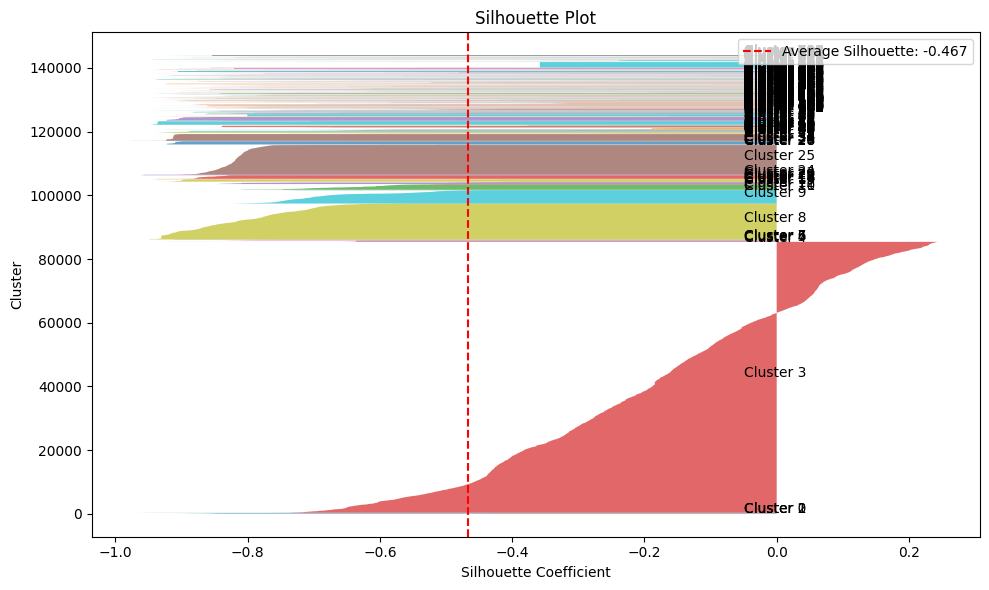

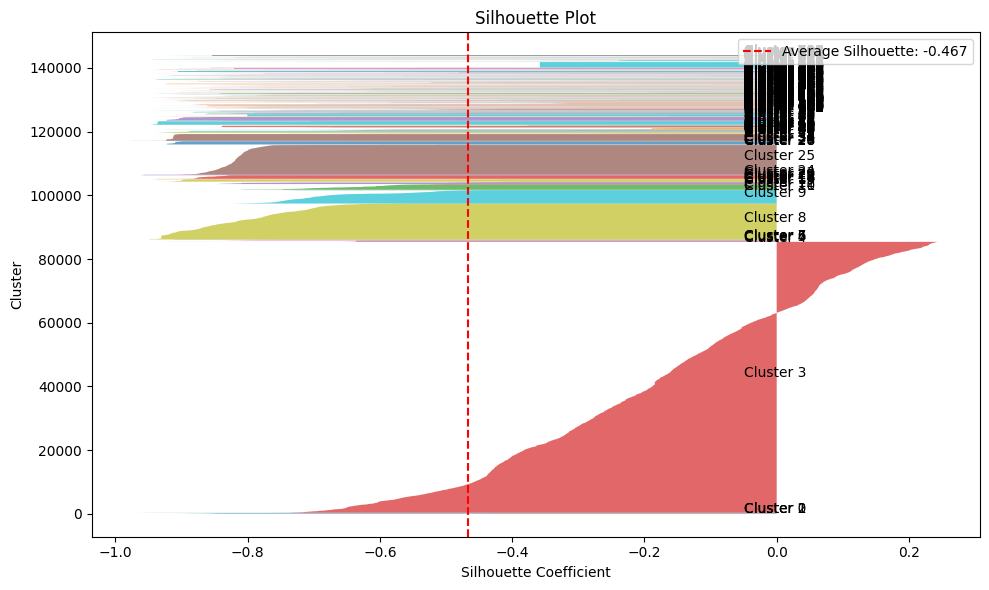

In [24]:
plot_silhouette(filtered_data_dsbcan['silhouette dbscan'].values, silhouette_score(scaled_data_filtered, best_labels_filtered, metric='euclidean'), best_labels_filtered, n_clusters=len(set(best_labels_filtered)) - (1 if -1 in best_labels_filtered else 0))

In [25]:
filtered_data_dsbcan_2 = data[(data['cluster dbscan'] == 3) | (data['cluster dbscan'] == 8) | (data['cluster dbscan'] == 9) | (data['cluster dbscan'] == 25)]
filtered_data_dsbcan_2

,id,user,lat,long,tags,title,date_taken_minute,date_taken_hour,date_taken_day,date_taken_month,...,date_upload_minute,date_upload_hour,date_upload_day,date_upload_month,date_upload_year,Unnamed: 16,Unnamed: 17,Unnamed: 18,cluster dbscan,silhouette dbscan
131,4385082504,22583865@N02,45.768675,4.786412,"street,lyon,graf,horloge,rue,2010,d700,tassinl...",Antisocial ! Tu perds ton sang froid !,58.0,18,22,2,...,1,16,24.0,2,2010.0,NaN,NaN,NaN,3,0.911668
148,4379528011,22583865@N02,45.768675,4.786412,"2010,50mmf14g,d700,thedigitalfly,lotfidakhli,a...",Mais émilie avait laissé un indice,59.0,18,22,2,...,11,22,22.0,2,2010.0,NaN,NaN,NaN,3,0.911668
204,4371624334,29161621@N03,45.782107,4.838973,"night,d50,sigma,1020mm,effect,nuit,pauselongue",Montée de la boucle de nuit en pause longue,56.0,23,19,2,...,10,0,20.0,2,2010.0,NaN,NaN,NaN,8,0.791924
205,4370802177,29161621@N03,45.781434,4.839166,"night,d50,1020mm,effect,nuit,pauselongue",DSC_3711,46.0,23,19,2,...,30,23,19.0,2,2010.0,NaN,NaN,NaN,8,0.821861
210,4370258533,26048905@N06,45.841370,4.798471,"summer,cricket,montsdor",DSC_2539,12.0,20,18,8,...,2,19,19.0,2,2010.0,NaN,NaN,NaN,9,0.726392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176711,46201593455,35971282@N00,45.841380,4.797695,"2019,france,rhone,montblanc,mont,blanc,thou,mo...",Mont-Blanc,0.0,0,1,1,...,30,20,16.0,2,2019.0,NaN,NaN,NaN,9,0.832265
177276,48073904383,37261055@N00,45.842175,4.798044,NaN,IMG_1674,37.0,9,6,5,...,19,19,16.0,6,2019.0,NaN,NaN,NaN,9,0.846425
177277,48073856061,37261055@N00,45.842186,4.798025,NaN,IMG_1676,37.0,9,6,5,...,19,19,16.0,6,2019.0,NaN,NaN,NaN,9,0.846363
182356,48697943886,41746313@N04,45.840869,4.798868,"lyon,confluence",Fourvière et la confluence,35.0,19,7,9,...,19,11,8.0,9,2019.0,NaN,NaN,NaN,9,0.566891


In [26]:
df_clustering_filtered = filtered_data_dsbcan_2.drop(columns_to_drop , axis=1)
# Scale the data
scaler = StandardScaler()
scaled_data_filtered = scaler.fit_transform(df_clustering_filtered)
# show
print(scaled_data_filtered)

[[-1.48779698e+00 -8.07885706e-01 -1.34172955e+00  1.49482836e+00]
 [-1.48779698e+00 -8.07885706e-01 -1.34172955e+00  1.49482836e+00]
 [-1.09369371e+00  5.32827379e-01 -4.82153182e-01 -5.06215486e-01]
 [-1.11343995e+00  5.37750376e-01 -4.82153182e-01 -5.93471076e-03]
 [ 6.45119735e-01 -5.00287694e-01 -3.10237908e-01 -1.60132103e+00]
 [ 6.48640610e-01 -5.13959851e-01 -3.10237908e-01  1.99990722e-01]
 [-1.80083210e+00  2.33821523e+00  2.44040647e+00 -9.62524437e-01]
 [-1.81500363e+00  2.32727240e+00  2.44040647e+00 -1.92811060e+00]
 [-1.49524950e+00 -8.02120953e-01 -1.34172955e+00  7.45554946e-01]
 [-1.79766332e+00  2.30181566e+00  2.44040647e+00 -1.41319477e+00]
 [-1.09345898e+00  5.52264288e-01 -4.82153182e-01  1.18908358e+00]
 [-1.09345898e+00  5.52264288e-01 -4.82153182e-01  1.18908358e+00]
 [ 6.51310607e-01 -5.20107219e-01 -3.10237908e-01  4.40484969e-01]
 [-1.10173304e+00  5.63258131e-01 -4.82153182e-01  1.55182775e+00]
 [-1.10663292e+00  5.59023843e-01 -4.82153182e-01  1.31779002e

In [27]:
fig = find_optimal_eps(scaled_data_filtered, 4)
fig.show() # display the plot

In [ ]:
best_eps = 0.038 #0.05
best_min_samples = 4
# Apply DBSCAN with best parameters
best_dbscan_filtered = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels_filtered = best_dbscan_filtered.fit_predict(scaled_data_filtered)

In [ ]:
data.to_csv("data/clustered-data.csv", index=False)